# Hands-on Image Processing with Python

## Chapter 8: Image Segmentation

**Author: Sandipan Dey**

In this chapter, we will discuss a key concept in image processing, namely segmentation. We will start by introducing the basic concepts of image segmentation and why it is so important. We will continue our discussion with a number of different image segmentation techniques along with their implementations in scikit-image and python-opencv (cv2) library functions. 


The topics to be covered in this chapter are as follows:
- Hough transform—circle and line detection in an image (with scikit-image)
- Thresholding and Otsu's segmentation (with scikit-image)
- Edges-based/region-based segmentation techniques (with scikit-image)
- Felzenszwalb, SLIC, QuickShift, and Compact Watershed algorithms (with scikit-image)
- Active contours, morphological snakes, and GrabCut algorithms (with scikit-image and python-opencv)

**What is image segmentation?**                                                        
Image segmentation is the partitioning of an image into distinct regions or categories that correspond to different objects or parts of objects. Each region contains pixels with similar attributes, and each pixel in an image is allocated to one of these categories. A good segmentation is typically one in which pixels in the same category have similar intensity values and form a connected region, whereas the neighboring pixels that are in different categories have dissimilar values. The goal of this is to simplify/change the representation of an image into something more meaningful and easier to analyze. If segmentation is done well, then all other stages in image analysis are made simpler. Hence, the quality and reliability of segmentation dictates whether an image analysis will be successful. But to partition an image into correct segments is often a very challenging problem.Segmentation techniques can be either non-contextual (do not consider spatial relationships between features in an image and group pixels only with regard to some global attributes, for example, color/gray level) or contextual (additionally exploit spatial relationships; for example, group spatially close pixels with similar gray levels). In this chapter, we will discuss different segmentation techniques and demonstrate their Python-based implementations using scikit-image, python-opencv (cv2) and SimpleITK

In [5]:
import numpy as np
from skimage.transform import (hough_line, hough_line_peaks, hough_circle, hough_circle_peaks)
from skimage.draw import circle_perimeter
from skimage.feature import canny
from skimage.data import astronaut
from skimage.io import imread, imsave
from skimage.color import rgb2gray, gray2rgb, label2rgb
from skimage import img_as_float
from skimage.morphology import skeletonize
from skimage import data, img_as_float
import matplotlib.pyplot as plt
from matplotlib import cm
from skimage.filters import sobel, threshold_otsu
from skimage.feature import canny
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries, find_boundaries
from matplotlib import pylab as pylab

### Hough transform – detecting lines and circles
In image processing, Hough transform is a feature extraction technique that aims to find instances of objects of a certain shape using a voting procedure carried out in a parameter space. In its simplest form, the classical Hough transform can be used to detect straight lines in an image. We can represent a straight line using polar parameters (ρ, θ), where ρ is the length of the line segment and θ is the angle in between the line and the x axis. To explore (ρ, θ) parameter space, it first creates a 2D-histogram. Then, for each value of ρ and θ, it computes the number of non-zero pixels in the input image that are close to the corresponding line and increments the array at position (ρ, θ) accordingly. Hence, each non-zero pixel can be thought of as voting for potential line candidates. The most probable lines correspond to the parameter values that obtained the highest votes, that is, the local maxima in a 2D histogram. The method can be extended to detect circles (and other curves). A similar voting method can be used to find maximum values in the parameter space of circles. The more parameters a curve has, the more it will be spatially and computationally expensive to use the Hough transform to detect the curve.


The next code block demonstrates how to use hough_line() or hough_line_peaks() functions and also how to use hough_circle() or hough_circle_peaks() functions from scikit-image transform module to to detect straight lines/circles from an input image with lines and circles, respectively:

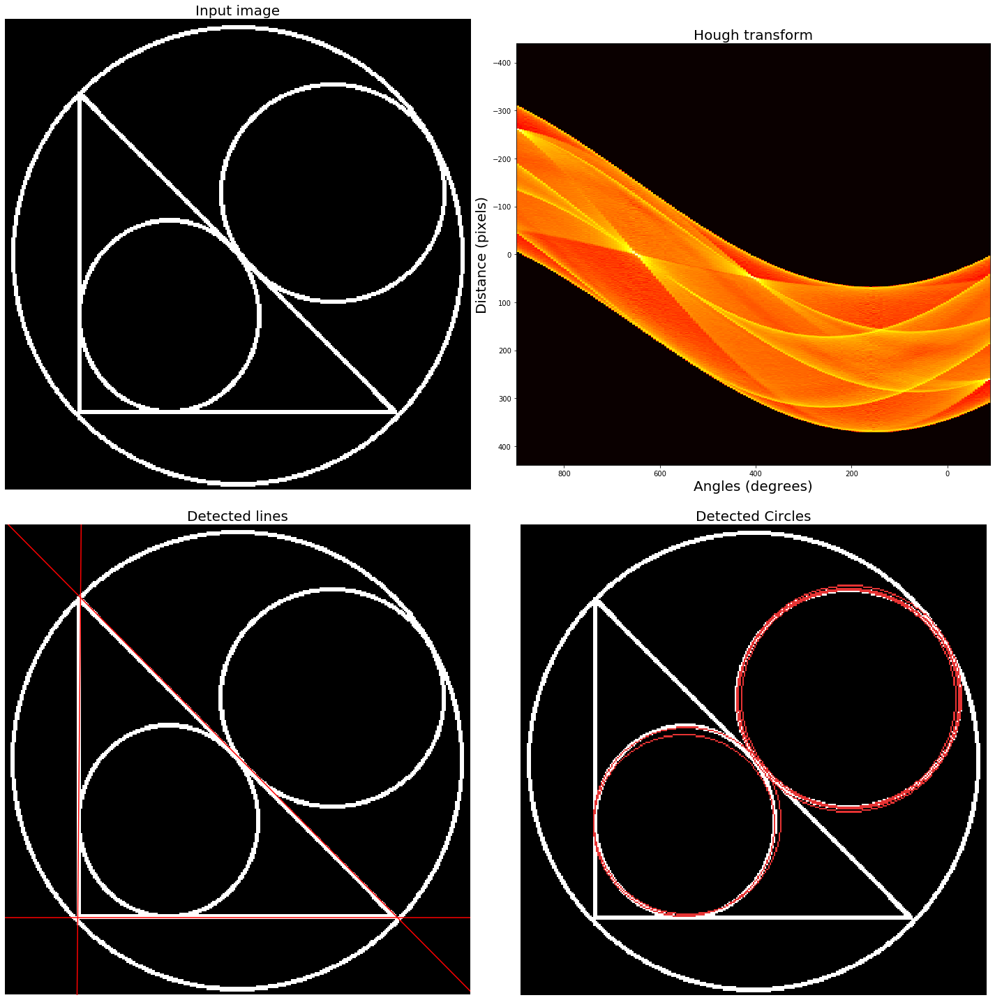

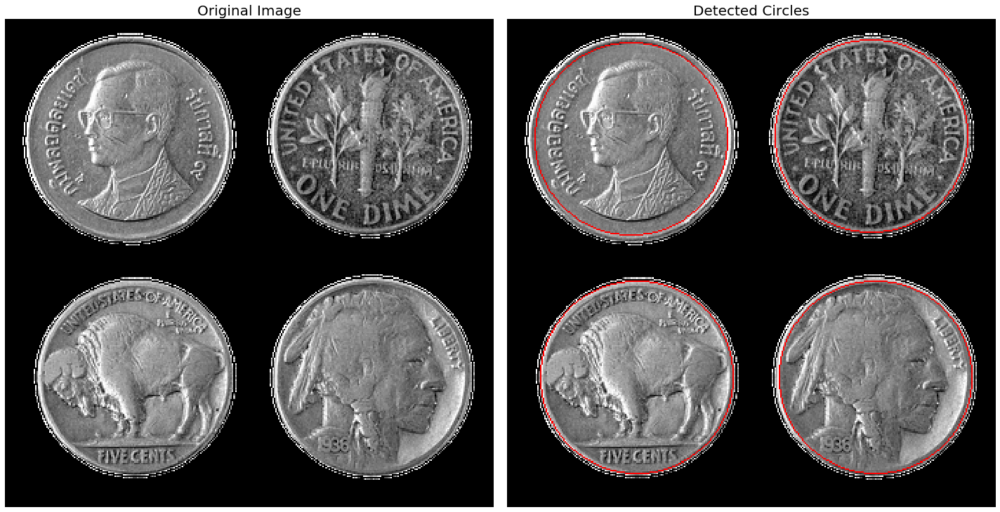

In [6]:
image = rgb2gray(imread('../images/triangle_circle.png'))

# Classic straight-line Hough transform
h, theta, d = hough_line(image)

# Generating figure 1
fig, axes = plt.subplots(2, 2, figsize=(20, 20))
ax = axes.ravel()

ax[0].imshow(image, cmap=cm.gray)
ax[0].set_title('Input image', size=20)
ax[0].set_axis_off()

ax[1].imshow(np.log(1 + h),
             extent=[10*np.rad2deg(theta[-1]), np.rad2deg(theta[0]), d[-1], d[0]],
             cmap=cm.hot, aspect=1/1.5)
ax[1].set_title('Hough transform', size=20)
ax[1].set_xlabel('Angles (degrees)', size=20)
ax[1].set_ylabel('Distance (pixels)', size=20)
ax[1].axis('image')

ax[2].imshow(image, cmap=cm.gray)
for _, angle, dist in zip(*hough_line_peaks(h, theta, d)):
    y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
    y1 = (dist - image.shape[1] * np.cos(angle)) / np.sin(angle)
    ax[2].plot((0, image.shape[1]), (y0, y1), '-r')
ax[2].set_xlim((0, image.shape[1]))
ax[2].set_ylim((image.shape[0], 0))
ax[2].set_axis_off()
ax[2].set_title('Detected lines', size=20)

hough_radii = np.arange(50, 100, 2)
hough_res = hough_circle(image, hough_radii)

# Select the most prominent 5 circles
accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii, total_num_peaks=6)

image = gray2rgb(image)
for center_y, center_x, radius in zip(cy, cx, radii):
    circy, circx = circle_perimeter(center_y, center_x, radius)
    image[circy, circx] = (0.9, 0.2, 0.2)

ax[3].imshow(image, cmap=plt.cm.gray)
ax[3].set_axis_off()
ax[3].set_title('Detected Circles', size=20)

plt.tight_layout()
plt.show()

image = rgb2gray(imread('../images/coins.png'))

fig, axes = plt.subplots(1, 2, figsize=(20, 10), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_axis_off()
ax[0].set_title('Original Image', size=20)

hough_radii = np.arange(65, 75, 1)
hough_res = hough_circle(image, hough_radii)

# Select the most prominent 5 circles
accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii, total_num_peaks=4)

image = gray2rgb(image)
for center_y, center_x, radius in zip(cy, cx, radii):
    circy, circx = circle_perimeter(center_y, center_x, radius)
    image[circy, circx] = (1, 0, 0)

ax[1].imshow(image, cmap=plt.cm.gray)
ax[1].set_axis_off()
ax[1].set_title('Detected Circles', size=20)

plt.tight_layout()
plt.show()

### Thresholding and Otsu's segmentation
**Thresholding** refers to a family of algorithms that use a pixel value as a threshold to create a binary image (an image with only black-and-white pixels) from a grayscale image. It provides the simplest way to segment objects from a background in an image. The threshold can be chosen manually (by looking at the histogram of pixel values) or automatically using algorithm. In scikit-image, there are two categories of thresholding algorithm implementations, namely histogram-based (a pixel intensity histogram is used with some assumptions of the properties of this histogram, for example bimodal) and local (only the neighboring pixels are used to process a pixel; it makes these algorithms more computationally expensive).


In this section, we shall only discuss a popular histogram-based thresholding method known as **Otsu's method** (with the assumption of a bimodal histogram). It computes an optimal threshold value by simultaneously maximizing the inter-class variance and minimizing the intra-class variance between two classes of pixels (which are separated by that threshold value). The next code block demonstrates an implementation of Otsu's segmentation with the horse input image and computes the optimal threshold to separate out the foreground from the background:

C:\Users\anto\Anaconda3\envs\gpuenv\lib\site-packages\ipykernel_launcher.py:16: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  app.launch_new_instance()


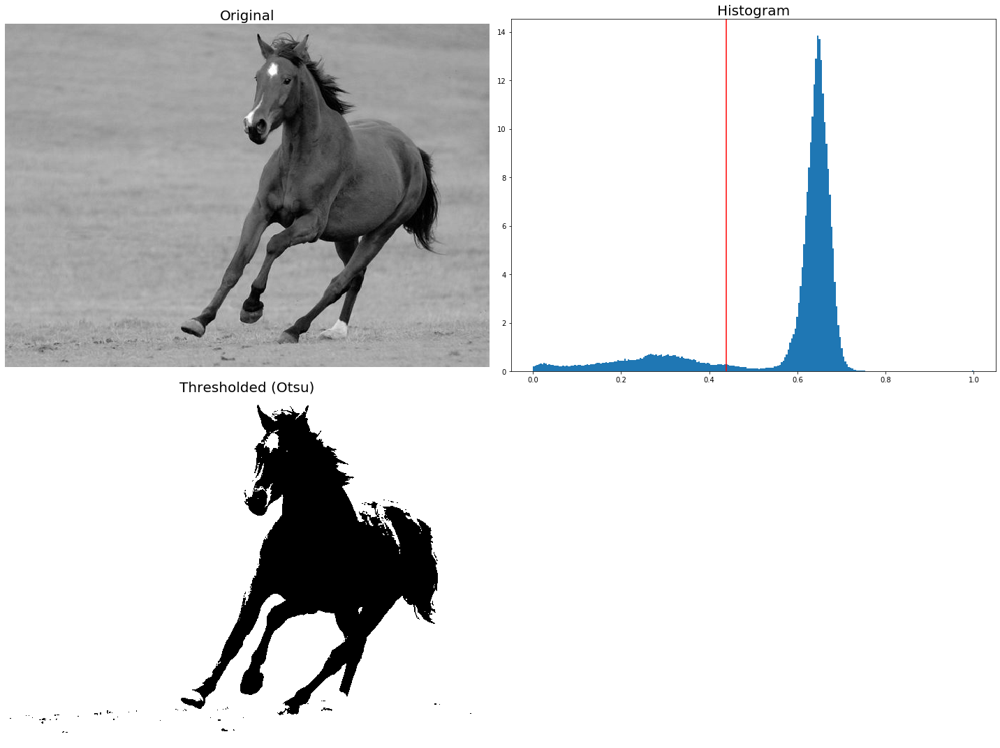

In [7]:
image =  rgb2gray(imread('../images/horse.jpg')) #data.camera()
thresh = threshold_otsu(image)
binary = image > thresh

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 15))
ax = axes.ravel()
ax[0] = plt.subplot(2, 2, 1)
ax[1] = plt.subplot(2, 2, 2)
ax[2] = plt.subplot(2, 2, 3, sharex=ax[0], sharey=ax[0])
ax[3] = plt.subplot(2, 2, 4, sharex=ax[0], sharey=ax[0])

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title('Original', size=20)
ax[0].axis('off')

ax[1].hist(image.ravel(), bins=256, normed=True)
ax[1].set_title('Histogram', size=20)
ax[1].axvline(thresh, color='r')

ax[2].imshow(binary, cmap=plt.cm.gray)
ax[2].set_title('Thresholded (Otsu)', size=20)
ax[2].axis('off')

ax[3].axis('off')

plt.tight_layout()
plt.show()

### Edges-based/region-based segmentation                                                        
This example, taken from the examples in the scikit-image documentation, demonstrates how to segment objects from a background by first using edge-based and then using region-based segmentation algorithms. The coins image from skimage.data is used as the input image, which shows several coins outlined against a darker background. The next code block displays the grayscale image and its intensity histogram:

C:\Users\anto\Anaconda3\envs\gpuenv\lib\site-packages\ipykernel_launcher.py:2: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  


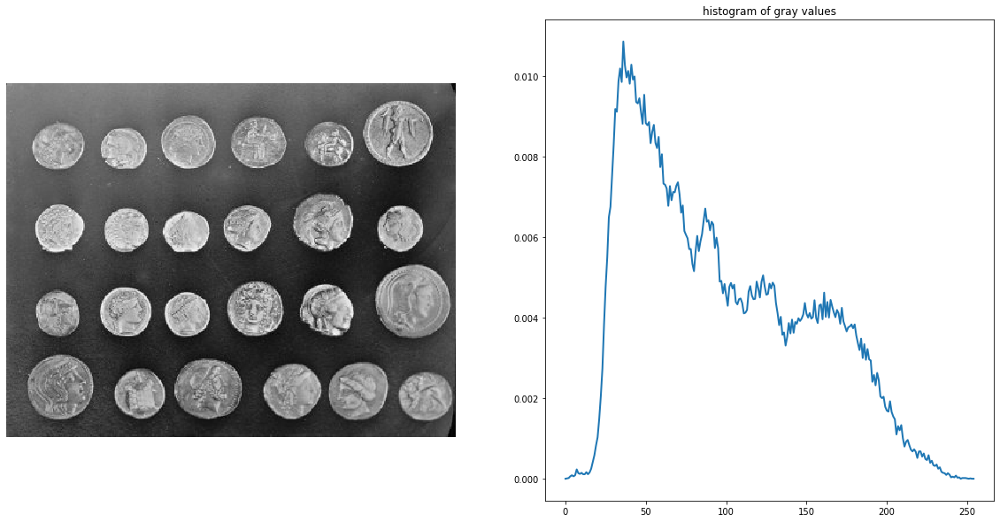

In [8]:
coins = data.coins()
hist = np.histogram(coins, bins=np.arange(0, 256), normed=True)
fig, axes = pylab.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(coins, cmap=pylab.cm.gray, interpolation='nearest')
axes[0].axis('off'), axes[1].plot(hist[1][:-1], hist[0], lw=2)
axes[1].set_title('histogram of gray values')
pylab.show()

### Edge-based segmentation
In this example, we will try to delineate the contours of the coins using edge-based segmentation. To do this, the first step is to get the edges of features using the Canny edge detector, demonstrated by the following code block

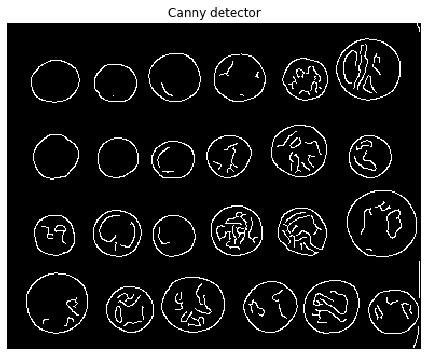

(Text(0.5, 1, 'Canny detector'), (-0.5, 383.5, 302.5, -0.5), None)

In [9]:
edges = canny(coins, sigma=2)
fig, axes = pylab.subplots(figsize=(10, 6))
axes.imshow(edges, cmap=pylab.cm.gray, interpolation='nearest')
axes.set_title('Canny detector'), axes.axis('off'), pylab.show()

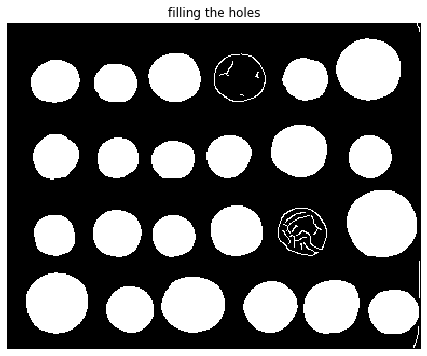

(Text(0.5, 1, 'filling the holes'), (-0.5, 383.5, 302.5, -0.5), None)

In [10]:
from scipy import ndimage as ndi
fill_coins = ndi.binary_fill_holes(edges)
fig, axes = pylab.subplots(figsize=(10, 6))
axes.imshow(fill_coins, cmap=pylab.cm.gray, interpolation='nearest')
axes.set_title('filling the holes'), axes.axis('off'), pylab.show()

As can be seen from the screenshot, there is a coin whose contour did not get filled with the operation. In the next step, the small spurious objects such as this one are then removed by setting a minimum size for valid objects and again using morphological functions, this time with the function remove_small_objects() from scikit-image morphology module

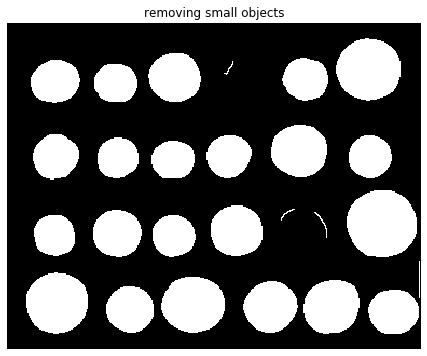

(Text(0.5, 1, 'removing small objects'), (-0.5, 383.5, 302.5, -0.5), None)

In [11]:
from skimage import morphology
coins_cleaned = morphology.remove_small_objects(fill_coins, 21)
fig, axes = pylab.subplots(figsize=(10, 6))
axes.imshow(coins_cleaned, cmap=pylab.cm.gray, interpolation='nearest')
axes.set_title('removing small objects'), axes.axis('off'), pylab.show()

However, this method is not very robust, since the contours that are not perfectly closed are not filled correctly, as is the case for one unfilled coin, as can be seen from the previous screenshot.

### Region-based segmentation                                                        
In this section, we will apply a region-based segmentation method to the same image using the morphological watershed algorithm. First, let's intuitively discuss the basic steps the watershed algorithm

**Morphological watershed algorithm**                                                        
Any grayscale image can be considered as a topographic surface. If this surface is flooded from its minima, and the merging of waters from different sources are prevented, and the image will be partitioned into two different sets, namely the catchment basins and the watershed lines. If this transform is applied to the image gradient, the catchment basins should theoretically correspond to the homogeneous gray-level regions (segments) of this image.


However, the image gets over-segmented using this transform in practice, because of noise or local irregularities in the gradient image. To prevent over-segmentation, a pre-defined set of markers are used and the flooding of the surface starts from these markers. Hence, the following are the steps in segmentation of an image by the watershed transformation:


- Find the markers and the segmentation criterion (the function that is to be used to split the regions, often it is the contrast/gradient)
- Run a marker-controlled watershed algorithm with these two elements

Now let's use the scikit-image implementation of the morphological watershed algorithm to separate the foreground coins from the background. The first step is to find an elevation map using the sobel gradient of the image, as demonstrated in the following code block

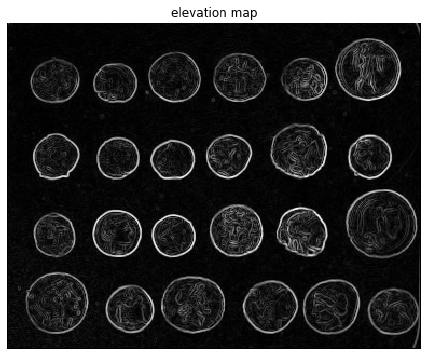

(Text(0.5, 1, 'elevation map'), (-0.5, 383.5, 302.5, -0.5), None)

In [12]:
elevation_map = sobel(coins)
fig, axes = pylab.subplots(figsize=(10, 6))
axes.imshow(elevation_map, cmap=pylab.cm.gray, interpolation='nearest')
axes.set_title('elevation map'), axes.axis('off'), pylab.show()

Next, the markers of the background and the coins are computed, based on the extreme parts of the histogram of gray values, as demonstrated in the following code block

2 0


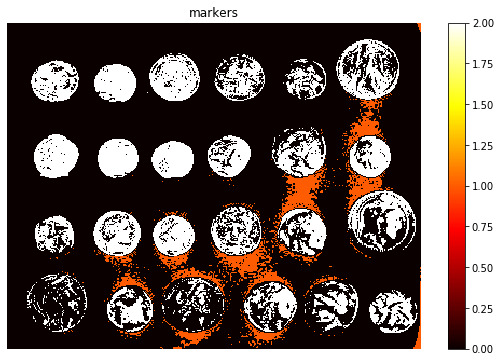

(Text(0.5, 1, 'markers'), (-0.5, 383.5, 302.5, -0.5), None)

In [15]:
markers = np.zeros_like(coins)
markers[coins < 30] = 1
markers[coins > 150] = 2
print(np.max(markers), np.min(markers))
fig, axes = pylab.subplots(figsize=(10, 6))
a = axes.imshow(markers, cmap=plt.cm.hot, interpolation='nearest')
plt.colorbar(a)
axes.set_title('markers'), axes.axis('off'), pylab.show()

Finally, the watershed transform is used to fill regions of the elevation map starting from the markers determined, as demonstrated in the next code block

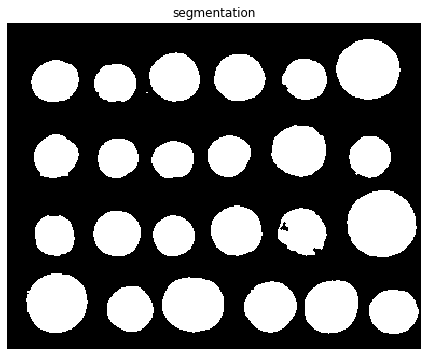

(Text(0.5, 1, 'segmentation'), (-0.5, 383.5, 302.5, -0.5), None)

In [16]:
segmentation = morphology.watershed(elevation_map, markers)
fig, axes = pylab.subplots(figsize=(10, 6))
axes.imshow(segmentation, cmap=pylab.cm.gray, interpolation='nearest')
axes.set_title('segmentation'), axes.axis('off'), pylab.show()

This last method works even better, and the coins can be segmented and labeled individually, as shown in the following code block

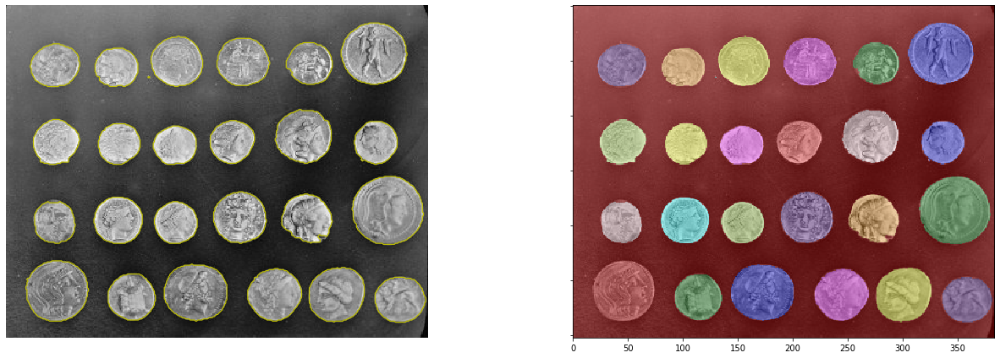

<Figure size 432x288 with 0 Axes>

In [17]:
segmentation = ndi.binary_fill_holes(segmentation - 1)
labeled_coins, _ = ndi.label(segmentation)
image_label_overlay = label2rgb(labeled_coins, image=coins)
fig, axes = pylab.subplots(1, 2, figsize=(20, 6), sharey=True)
axes[0].imshow(coins, cmap=pylab.cm.gray, interpolation='nearest')
axes[0].contour(segmentation, [0.5], linewidths=1.2, colors='y')
axes[1].imshow(image_label_overlay, interpolation='nearest')
for a in axes: 
    a.axis('off')
    pylab.tight_layout(), pylab.show()

### Felzenszwalb's efficient graph-based image segmentation
Felzenszwalb's algorithm takes a graph-based approach to segmentation. It first constructs an undirected graph with the image pixels as vertices (the set to be segmented) and the weight of an edge between the two vertices being some measure of the dissimilarity (for example, the difference in intensity). In the graph-based approach, the problem of partitioning an image into segments translates to finding a connected components in the constructed graph. The edges between two vertices in the same component should have relatively low weights, and edges between vertices in different components should have higher weights.


The algorithm runs in time nearly linear in the number of graph edges and is also fast in practice. This technique preserves the details in low-variability image regions while ignores the details in high-variability regions. The algorithm has a single-scale parameter that influences the size of the segments. The actual size and the number of the segments can vary greatly, depending on local contrast. The following code block demonstrates how to use the scikit-image segmentation module's implementation of this algorithm and the output segmented images obtained using a few input images

In [18]:
from skimage.data import astronaut
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries, find_boundaries
from skimage.util import img_as_float

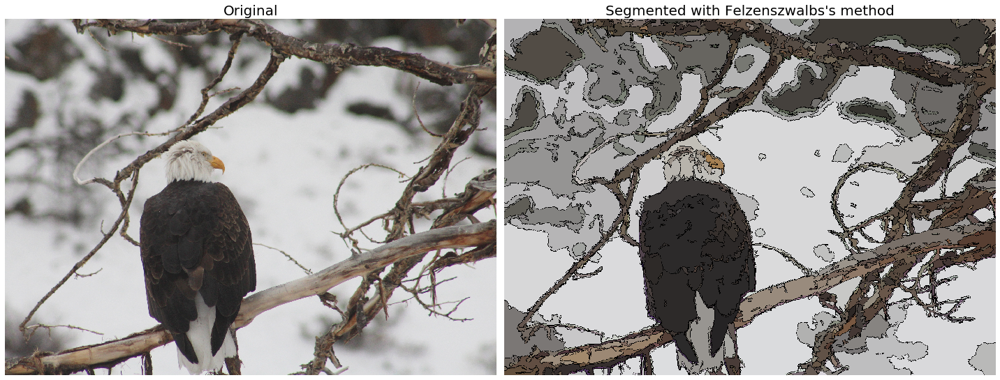

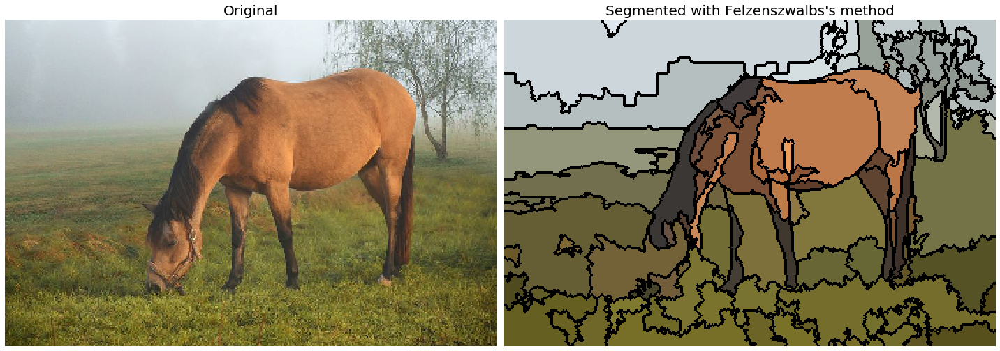

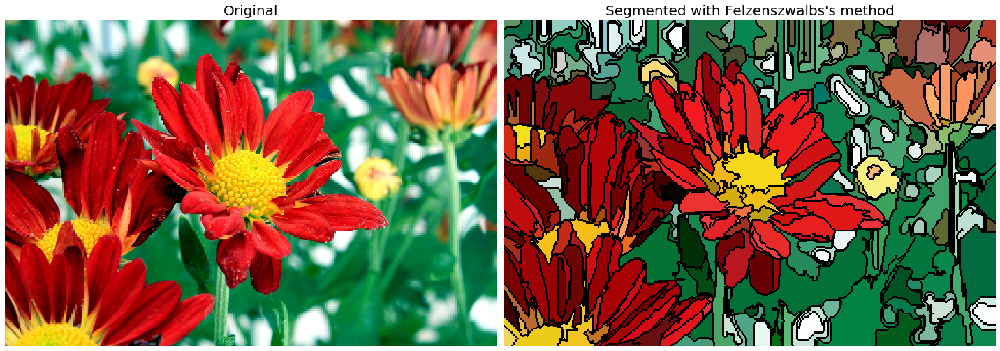

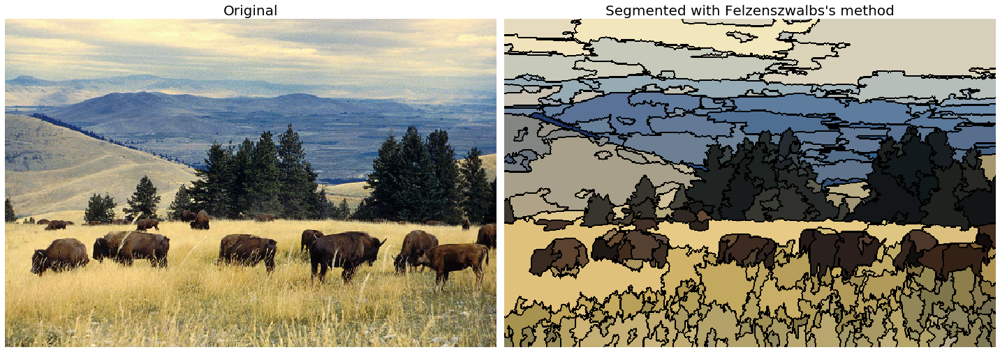

In [19]:
from matplotlib.colors import LinearSegmentedColormap
for imfile in ['../images/eagle.jpg', '../images/horses.jpg', '../images/flowers.jpg', '../images/bisons.jpg']:
    img = img_as_float(imread(imfile)[::2, ::2, :3])
    plt.figure(figsize=(20,10))
    segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=100) #300
    borders = find_boundaries(segments_fz)
    unique_colors = np.unique(segments_fz.ravel())
    segments_fz[borders] = -1 #len(unique_colors)
    colors = [np.zeros(3)]
    for color in unique_colors:
        colors.append(np.mean(img[segments_fz == color], axis=0))    
    cm = LinearSegmentedColormap.from_list('pallete', colors, N=len(colors))
    plt.subplot(121)
    plt.imshow(img)
    plt.title('Original', size=20)
    plt.axis('off') 
    plt.subplot(122)
    plt.imshow(segments_fz, cmap=cm)
    plt.title('Segmented with Felzenszwalbs\'s method', size=20)
    plt.axis('off')   
    plt.tight_layout()
    plt.show()

The following code block demonstrates how the result of the algorithm changes when the scale parameter is varied

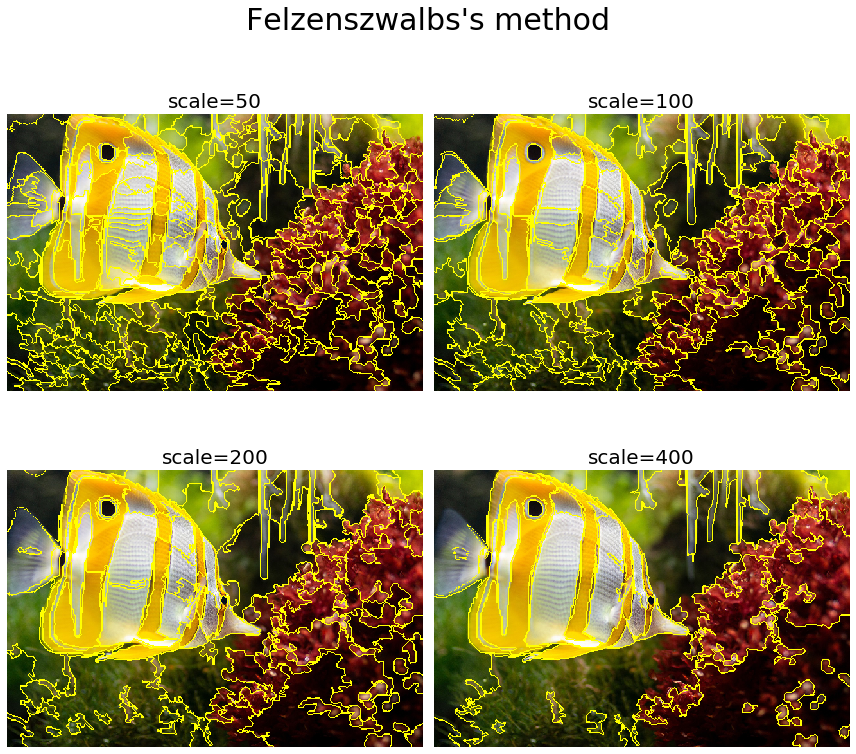

In [34]:
def plot_image(img, title):
    plt.imshow(img)
    plt.title(title, size=20)
    plt.axis('off')    
    
img = imread('../images/fish.jpg')[::2, ::2, :3] #img_as_float(astronaut()[::2, ::2])

plt.figure(figsize=(12,12))
i = 1
for scale in [50, 100, 200, 400]:
    plt.subplot(2,2,i)
    segments_fz = felzenszwalb(img, scale=scale, sigma=0.5, min_size=200)
    plot_image(mark_boundaries(img, segments_fz), 'scale=' + str(scale))
    i += 1
plt.suptitle('Felzenszwalbs\'s method', size=30)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Segmentation with SLIC

The SLIC algorithm simply performs k-means clustering (we will explore more on this clustering algorithm in Chapter 9, Classical Machine Learning Methods in Image Processing) in the five-dimensional space of color space (RGB or Lab) and image location (that is, pixel coordinates: x, y). This algorithm is very efficient, since the clustering method is simpler. To obtain good results with this algorithm, it is essential to work in Lab color space. <span class="mark">The algorithm has quickly gained momentum and is now widely used</span>. The compactness parameter trades off color-similarity and proximity, while n_segments parameter chooses the number of centers for k-means. The next code block demonstrates how to implement this algorithm using the scikit-image segmentation module. It also shows how the output varies with the compactness parameter value

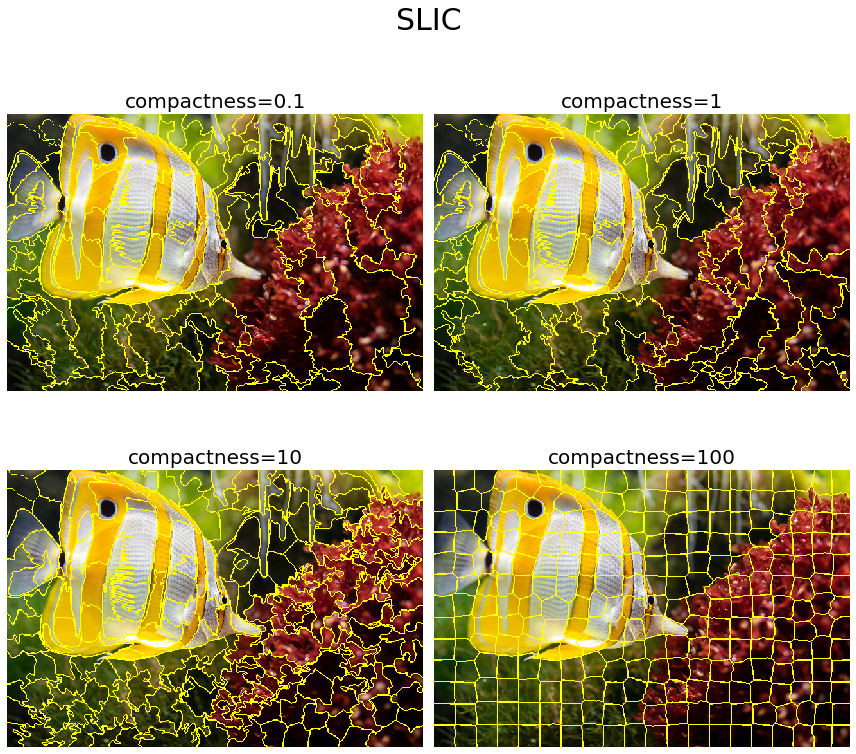

In [35]:
plt.figure(figsize=(12,12))
i = 1
for compactness in [0.1, 1, 10, 100]:
    plt.subplot(2,2,i)
    segments_slic = slic(img, n_segments=250, compactness=compactness, sigma=1)
    plot_image(mark_boundaries(img, segments_slic), 'compactness=' + str(compactness))
    i += 1
plt.suptitle('SLIC', size=30)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Segmentation with QuickShift

**QuickShift** is a 2D image segmentation algorithm that is based on an approximation of the kernelized mean-shift algorithm and is relatively recent. It belongs to the family of local (non-parametric) mode-seeking algorithms (based on the idea of associating each data point to a mode of the underlying probability density function) and is applied to the 5D space consisting of color space and image location.


QuickShift actually computes a hierarchical segmentation of multiple scales simultaneously, which is one of the benefits of this algorithm. QuickShift has two main parameters: the parameter sigma controls the scale of the local density approximation, where the parameter max_dist selects a level in the hierarchical segmentation that is produced. There is also a trade-off between distance in color-space and distance in image-space, given by ratio. The next code snippet demonstrates how to use the scikit-image implementation of the algorithm. It also shows the impact of varying the max_distance and ratio parameters on the segmentation output obtained

The next screenshot shows the output of the code block. As can be seen, the max_dist parameter works as a cut-off point for data distances: the higher the value of the parameter, the fewer the number of clusters. On the contrary, the parameter ratio balances color-space proximity and image-space proximity: higher values of this parameter give more weight to color-space

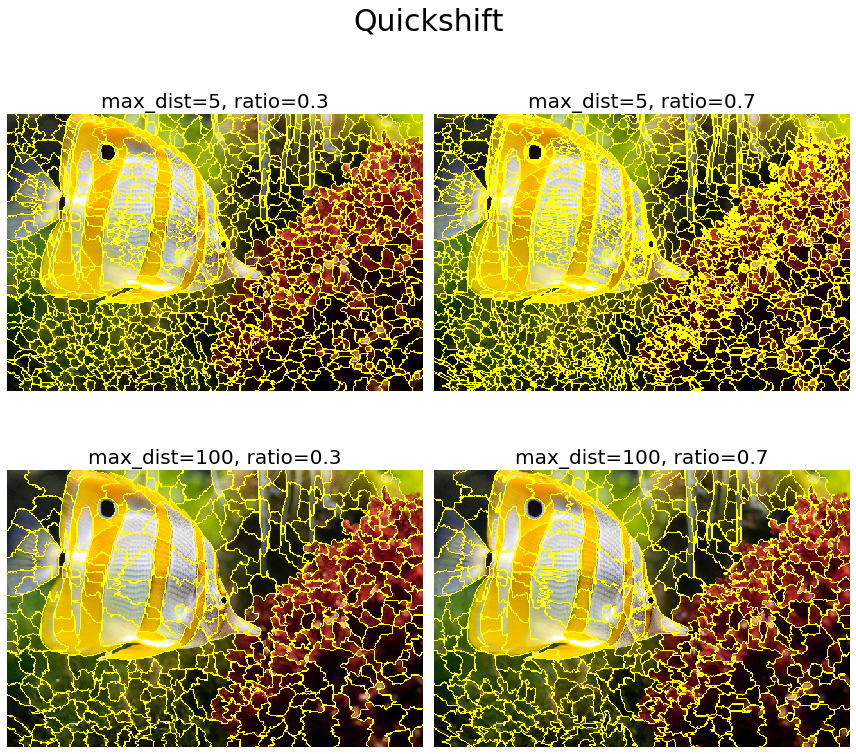

In [36]:
plt.figure(figsize=(12,12))
i = 1
for max_dist in [5, 100]:
    for ratio in [0.3, 0.7]:
        plt.subplot(2,2,i)
        segments_quick = quickshift(img, kernel_size=3, max_dist=max_dist, ratio=ratio)
        plot_image(mark_boundaries(img, segments_quick), 'max_dist=' + str(max_dist) + ', ratio=' + str(ratio))
        i += 1
plt.suptitle('Quickshift', size=30)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Segmentation with Watershed

As discussed earlier, the watershed algorithm computes watershed catchment basins in an image flooded from given markers, apportioning the pixels into marked basins. The algorithm requires a grayscale gradient image as input (viewing the image as a landscape), where the bright pixels indicate a boundary (forming high peaks) between the regions. From the given markers, this landscape is then flooded until different flood basins meet at the peaks. A different image segment is formed by each distinct basin. As we had with SLIC, there is an additional compactness argument that makes it harder for markers to flood faraway pixels. Higher values of compactness make the watershed regions more regularly shaped. The next code block demonstrates how the scikit-image implementation of this algorithm can be used. It also shows the impact of changing the markers and compactness parameters on the segmentation results

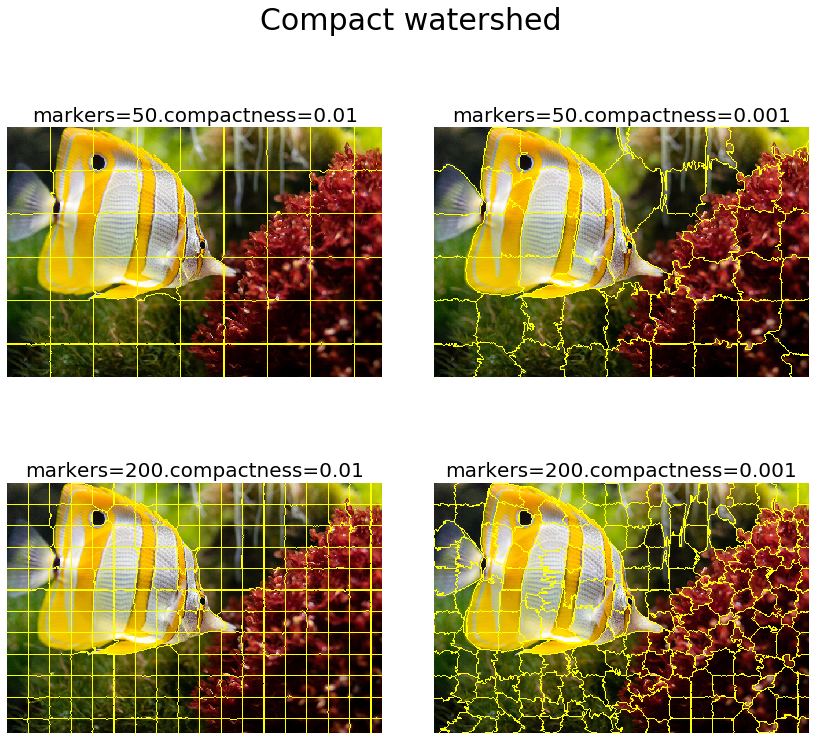

In [37]:
gradient = sobel(rgb2gray(img))
plt.figure(figsize=(12,12))
i = 1
for markers in [50, 200]:
    for compactness in [0.01, 0.001]:
        plt.subplot(2,2,i)
        segments_watershed = watershed(gradient, markers=markers, compactness=compactness)
        plot_image(mark_boundaries(img, segments_watershed), 'markers=' + str(markers) + '.compactness=' + str(compactness))
        i += 1
plt.suptitle('Compact watershed', size=30)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### RAG merging

In this section, we discuss how the **Region Adjacency Graph (RAG)** can be used to combine the over-segmented regions of an image, to obtain a better segmentation. It uses the SLIC algorithm to first segment the input image and obtain the region labels. Then, it constructs a RAG and progressively merges the over-segmented regions that are similar in color. Merging two adjacent regions produces a new region with all the pixels from the merged regions. Regions are merged until no highly similar region pairs remain

In [43]:
from skimage import segmentation
from skimage.future import graph

def _weight_mean_color(graph, src, dst, n): 
    diff = graph.node[dst]['mean color'] - graph.node[n]['mean color'] 
    diff = np.linalg.norm(diff) 
    return {'weight': diff}

def merge_mean_color(graph, src, dst): 
    graph.node[dst]['total color'] += graph.node[src]['total color'] 
    graph.node[dst]['pixel count'] += graph.node[src]['pixel count'] 
    graph.node[dst]['mean color'] = (graph.node[dst]['total color'] /  
                                     graph.node[dst]['pixel count'])
    img = imread('../images/me12.jpg') 
    labels = segmentation.slic(img, compactness=30, n_segments=400)
    g = graph.rag_mean_color(img, labels)
    labels2 = graph.merge_hierarchical(labels, g, thresh=35, rag_copy=False, 
                                       in_place_merge=True, 
                                       merge_func=merge_mean_color, 
                                       weight_func=_weight_mean_color)
    out = label2rgb(labels2, img, kind='avg')
    out = segmentation.mark_boundaries(out, labels2, (0, 0, 0))
    pylab.figure(figsize=(20,10))
    pylab.subplot(121), pylab.imshow(img), pylab.axis('off')
    pylab.subplot(122), pylab.imshow(out), pylab.axis('off')
    pylab.tight_layout()
    pylab.show()

### Region growing with SimpleITK

Region growing refers to a class of segmentation algorithms where a pixel's neighbor is considered to be in the same segment if its intensity is similar to the current pixel. How the similarity is defined varies across algorithms. The initial set of pixels are called seed points that are usually manually selected. The next code block demonstrates how to use the SimpleITK library's implementation of the ConnectedThreshold (on variant of the region growing segmentation algorithm). A cranial MRI scan (T1) medical image is used as the input image. In the case of the ConnectedThreshold algorithm, a voxel's (volume pixel) neighbor is considered to be in the same segment if the neighboring voxel's intensity is within two explicitly specified lower and upper thresholds.

A fixed seed point is used to start the algorithm, and the upper threshold is varied (by keeping the lower threshold fixed), to see the effects of the resulting segmentation

In [47]:
import SimpleITK as sitk
def show_image(img, title=None):
    nda = sitk.GetArrayViewFromImage(img)
    #nda = np.transpose(nda, (1, 2, 0))
    #print(nda.shape)
    plt.imshow(nda, cmap='gray')   
    plt.axis('off')
    if(title):
        plt.title(title, size=20)

The following screenshots show the output of the region—growing ConnectedThreshold algorithm with different values of the upper threshold. The seed voxel to start with is indicated by a red point.


As can be seen from the next screenshot, the higher the upper-threshold value, the larger the size of the segmented region obtained using the ConnectedThreshold algorithm, which is as expected:


With upper threshold value = 80 

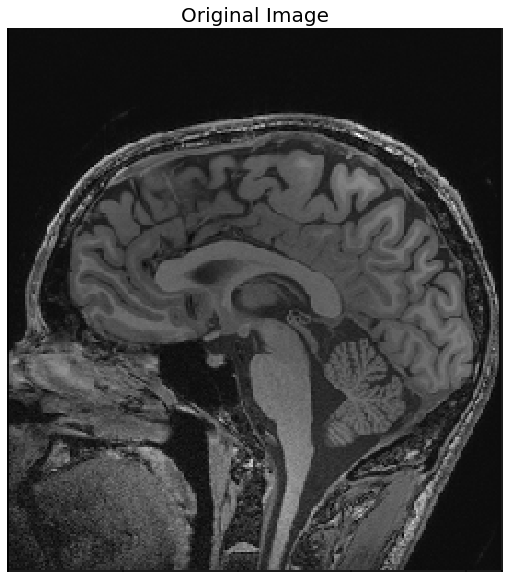

In [48]:
img = 255*rgb2gray(imread('../images/mri_T1.png'))
#img = np.transpose(img, (2, 0, 1))
img_T1 = sitk.GetImageFromArray(img) 
img_T1_255 = sitk.Cast(sitk.RescaleIntensity(img_T1), sitk.sitkUInt8)
#print(img_T1.GetSize())
#nda = sitk.GetArrayViewFromImage(img_T1)
#print(nda.shape, nda.ndim)
plt.figure(figsize=(10,10))
show_image(img_T1, "Original Image")

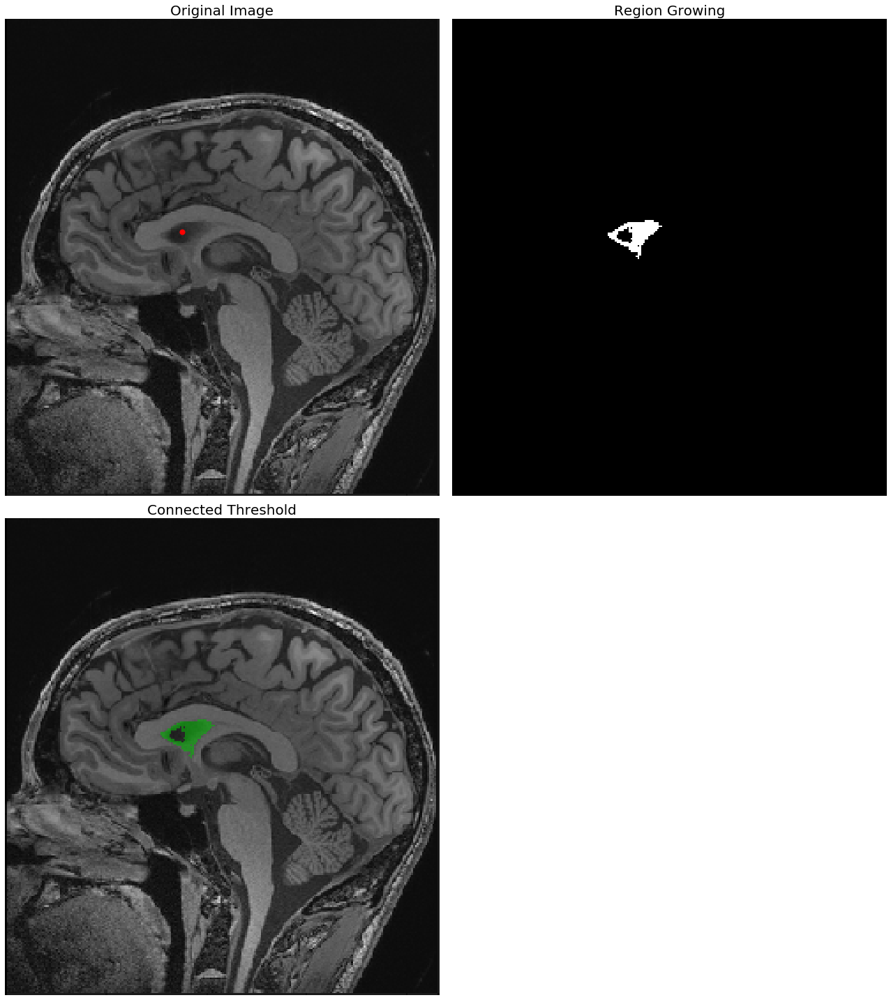

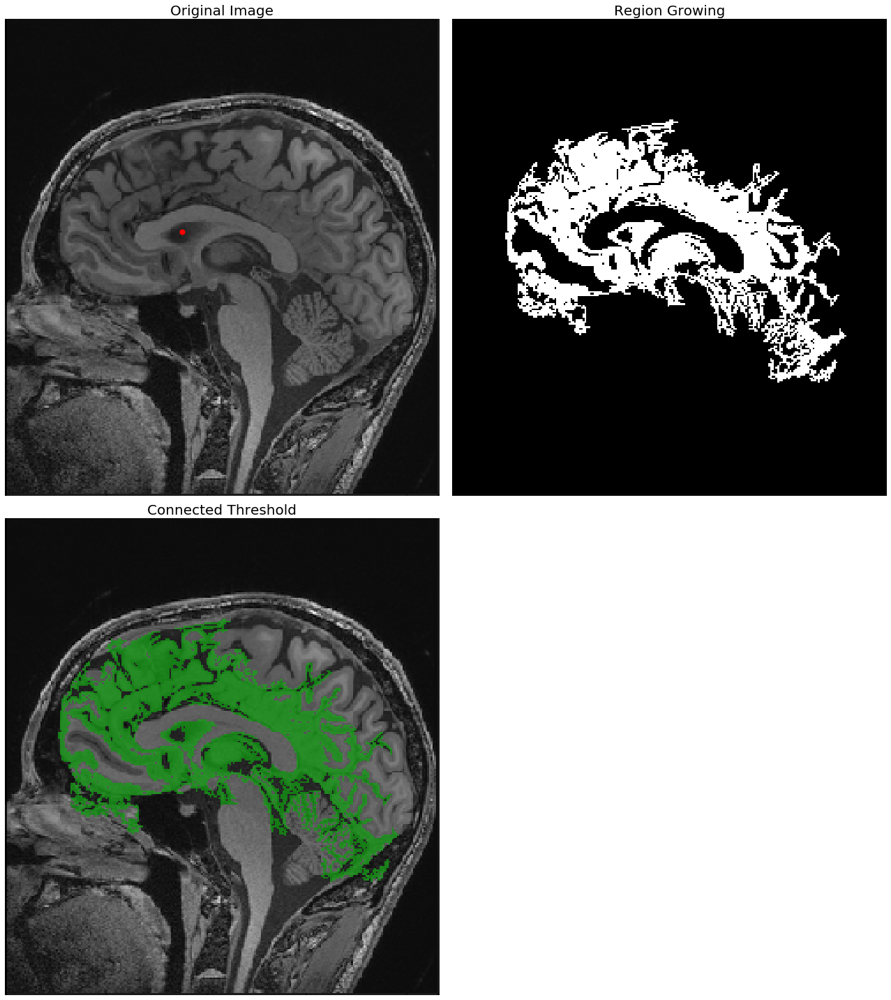

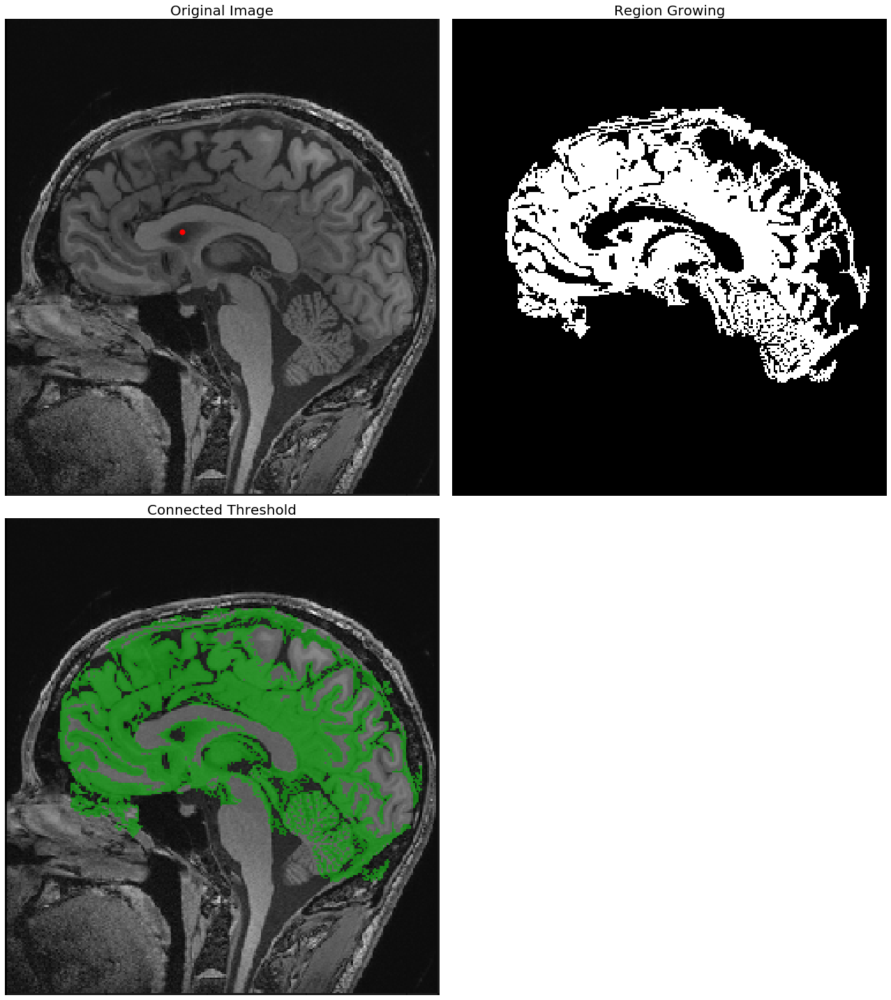

In [50]:
seed = (100,120)
for upper in [80, 85, 90]:
    plt.figure(figsize=(18,20))
    plt.subplot(221)
    show_image(img_T1, "Original Image")
    plt.scatter(seed[0], seed[1], color='red', s=50)
    plt.subplot(222)
    seg = sitk.ConnectedThreshold(img_T1, seedList=[seed], lower=40, upper=upper)
    show_image(seg, "Region Growing")
    plt.subplot(223)
    show_image(sitk.LabelOverlay(img_T1_255, seg), "Connected Threshold")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

### Active contours 

The **active contour model (also known as snakes)** is a framework that fits open or closed splines to lines or edges in an image. A snake is an energy-minimizing, deformable spline influenced by constraint, image, and internal forces. Hence, it works by minimizing an energy that is partially defined by the image and partially by the spline's shape, length, and smoothness. The constraint and image forces pull the snake toward object contours and internal forces resist the deformation. The algorithm accepts an initial snake (around the object of interest) and to fit the closed contour to the object of interest, it shrinks/expands. The minimization is done explicitly in the image energy and implicitly in the shape energy. As the number of points is constant, we need to ensure that the initial snake has enough points to capture the details of the final contour.


In the following example, taken from the scikit-image documentation, the active contour model is going to be used to segment the face of a person (the astronaut) from the rest of an image by fitting a spline to the edges of the face. The image is smoothed a bit as a pre-processing step. First, a circle is initialized around the astronaut's face and the default boundary condition bc='periodic' is used to fit a closed curve. To make the curve search toward edges (for example, the boundaries of the face), the default parameter values w_line=0, w_edge=1 are used. The next code block demonstrates how to use the active_contour() function for segmentation (which runs an iterative algorithm with a maximum number of iterations that can be specified by a parameter to the function), and shows the closed contour line obtained by running the algorithm internally for a different number of iterations


The next screenshot shows the output of the code. The initial circle to start with was the dotted blue circle. The active contour algorithm iteratively shrinks the contour (denoted by the red lines) starting from the circle toward the face, and finally, at max_iteration=100, fits itself to the boundary of the face, thereby segmenting the face out from the image

C:\Users\anto\Anaconda3\envs\gpuenv\lib\site-packages\ipykernel_launcher.py:13: FutureWarning: The coordinates used by `active_contour` will change from xy coordinates (transposed from image dimensions) to rc coordinates in scikit-image 0.18. Set `coordinates='rc'` to silence this warning. `coordinates='xy'` will restore the old behavior until 0.18, but will stop working thereafter.
  del sys.path[0]


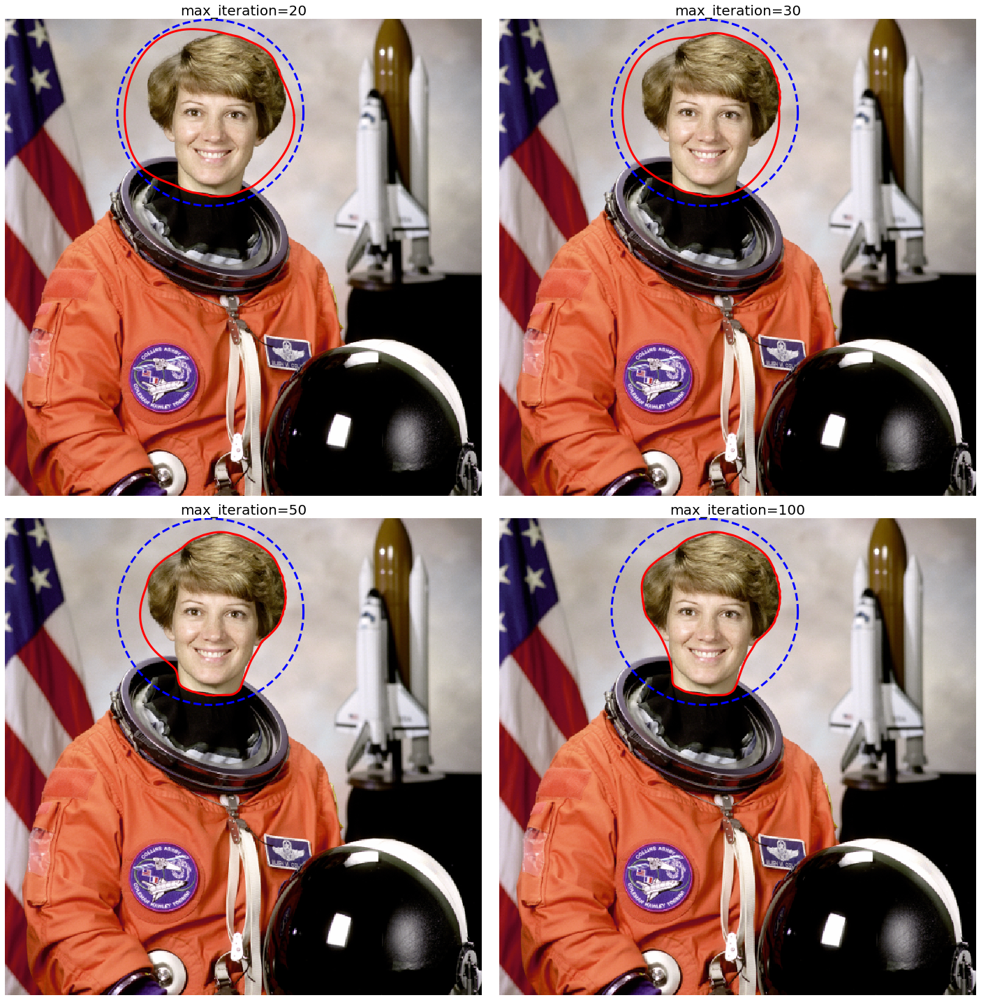

(None, None)

In [51]:
from skimage import data
from skimage.filters import gaussian
from skimage.segmentation import active_contour
img = data.astronaut()
img_gray = rgb2gray(img)
s = np.linspace(0, 2*np.pi, 400)
x = 220 + 100*np.cos(s)
y = 100 + 100*np.sin(s)
init = np.array([x, y]).T
i = 1
plt.figure(figsize=(20,20))
for max_it in [20, 30, 50, 100]:
    snake = active_contour(gaussian(img_gray, 3), init, alpha=0.015, beta=10, gamma=0.001, max_iterations=max_it)
    plt.subplot(2,2,i), plt.imshow(img), plt.plot(init[:, 0], init[:,
    1], '--b', lw=3)
    plt.plot(snake[:, 0], snake[:, 1], '-r', lw=3)
    plt.axis('off'), plt.title('max_iteration=' + str(max_it), size=20)
    i += 1
plt.tight_layout(), plt.show()

### Morphological snakes

Morphological snakes refers to a family of methods (similar to the active contours) for image segmentation. However, the morphological snakes are faster and numerically more stable than the active contours, since they use morphological operators (for example, dilation/erosion) over a binary array, whereas the active contours solve PDEs over a floating-point array. There are a couple of morphological snakes methods available in the scikit-image implementation, namely Morphological Geodesic Active Contours (MorphGAC with morphological_geodesic_active_contour()) and Morphological Active Contours without Edges (MorphACWE with morphological_chan_vese()). MorphGAC is suitable for images with visible (may be noisy, cluttered, or partially unclear) contours and requires that the image is preprocessed to highlight the contours. This preprocessing can be done using the function inverse_gaussian_gradient(). This preprocessing step has a great impact on the quality of the MorphGAC segmentation. On the contrary, when the pixel values of the inside and the outside regions of the object to segment have different averages, MorphACWE works well. It works with the original image without any preprocessing and does not need the contours of the object to be defined. For this reason, MorphACWE is easier to use and tune than MorphGAC. The next code block demonstrates how to implement morphological snakes using these functions. It also shows the evolution of the algorithms and the segmentation obtained at different iterations

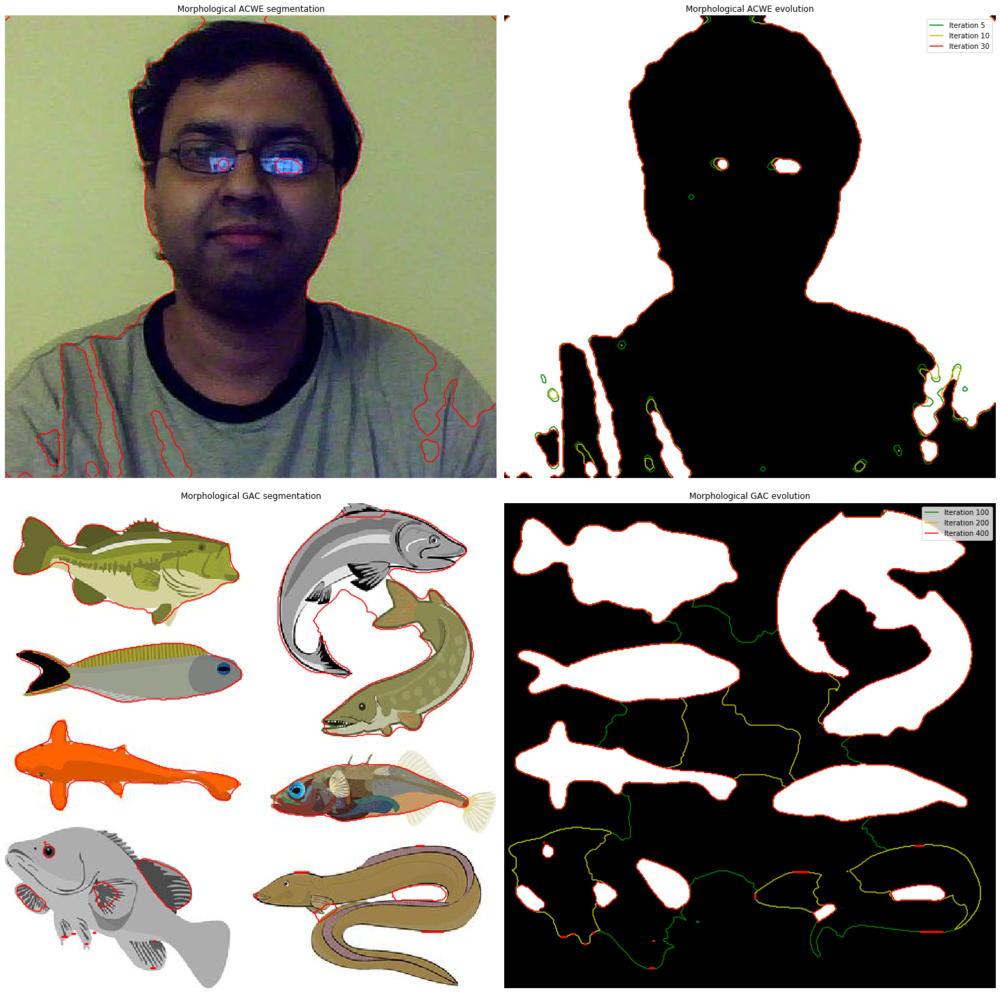

(None, None)

In [52]:
from skimage.segmentation import (morphological_chan_vese, morphological_geodesic_active_contour,
                                  inverse_gaussian_gradient, checkerboard_level_set)

def store_evolution_in(lst):
    """Returns a callback function to store the evolution of the level sets in
    the given list.
    """

    def _store(x):
        lst.append(np.copy(x))
       
    return _store

# Morphological ACWE
image = imread('../images/me14.jpg')
image_gray = rgb2gray(image)
# initial level set
init_lvl_set = checkerboard_level_set(image_gray.shape, 6)
# list with intermediate results for plotting the evolution
evolution = []
callback = store_evolution_in(evolution)
lvl_set = morphological_chan_vese(image_gray, 30, init_level_set=init_lvl_set, smoothing=3, iter_callback=callback)

fig, axes = plt.subplots(2, 2, figsize=(20, 20))
axes = axes.flatten()
axes[0].imshow(image, cmap="gray"), axes[0].set_axis_off(),
axes[0].contour(lvl_set, [0.5], colors='r')
axes[0].set_title("Morphological ACWE segmentation", fontsize=12)
axes[1].imshow(lvl_set, cmap="gray"), axes[1].set_axis_off()
contour = axes[1].contour(evolution[5], [0.5], colors='g')
contour.collections[0].set_label("Iteration 5")
contour = axes[1].contour(evolution[10], [0.5], colors='y')
contour.collections[0].set_label("Iteration 10")
contour = axes[1].contour(evolution[-1], [0.5], colors='r')
contour.collections[0].set_label("Iteration " + str(len(evolution)-1))
axes[1].legend(loc="upper right"), axes[1].set_title("Morphological ACWE evolution", fontsize=12)
                                                     
# Morphological GAC
image = imread('../images/fishes4.jpg')
image_gray = rgb2gray(image)
gimage = inverse_gaussian_gradient(image_gray)
# initial level set
init_lvl_set = np.zeros(image_gray.shape, dtype=np.int8)
init_lvl_set[10:-10, 10:-10] = 1
# list with intermediate results for plotting the evolution
evolution = []
callback = store_evolution_in(evolution)
lvl_set = morphological_geodesic_active_contour(gimage, 400, init_lvl_set, smoothing=1, balloon=-1, threshold=0.7, iter_callback=callback)
axes[2].imshow(image, cmap="gray"), axes[2].set_axis_off(),
axes[2].contour(lvl_set, [0.5], colors='r')
axes[2].set_title("Morphological GAC segmentation", fontsize=12)
axes[3].imshow(lvl_set, cmap="gray"), axes[3].set_axis_off()
contour = axes[3].contour(evolution[100], [0.5], colors='g')
contour.collections[0].set_label("Iteration 100")
contour = axes[3].contour(evolution[200], [0.5], colors='y')
contour.collections[0].set_label("Iteration 200")
contour = axes[3].contour(evolution[-1], [0.5], colors='r')
contour.collections[0].set_label("Iteration " + str(len(evolution)-1))
axes[3].legend(loc="upper right"), axes[3].set_title("Morphological GAC evolution", fontsize=12)
fig.tight_layout(), plt.show()

### GrabCut with OpenCV                                                        
**GrabCut** is an interactive segmentation method that extracts the foreground from the background in an image using the graph-theoretic max-flow/min-cut algorithm. Before the algorithm can start, the user first needs to provide some hint by specifying the foreground region in the input image roughly with minimum possible interaction (for example, by drawing a rectangle around the foreground region). The algorithm then segments the image iteratively to get the best possible result. In some cases, the segmentation may not be the desired one (for example, the algorithm may have marked some foreground region as background and vice versa).


In that case, the user needs to do fine touch-ups again by giving some strokes on the images (by marking some more pixels as foreground or background) where there are some wrongly segmented pixels. This results in better segmentation in the next iteration.


The next code snippet demonstrates how the foreground whale object can be extracted from the input image by just drawing a rectangle around the whale (by providing a hint to the algorithm that the foreground object needs to be found inside the rectangle) and calling the grabCut() function from cv2 on the input image. The mask image is an image through which we can specify which regions in the image are surely background, surely foreground, or probable background/foreground, using the following flags, 0 (cv2.GC_BGD), 1 (cv2.GC_FGD), 2 (cv2.GC_PR_BGD), 3 (cv2.GC_PR_FGD). Since in this case a rectangle is used (instead of the mask) to indicate the foreground, the mode parameter to the cv2.grabCut() function needs to be cv2.GC_INIT_WITH_RECT, and the mask image is set to zeros, initially. The algorithm is run for five iterations, and it modifies the mask image where the pixels are marked with four flag values denoting background/foreground. Next, we modify the mask so that all 0/2 valued pixels are set to 0 (background) and all 1/3 valued pixels are set to 1 (foreground); after this, we obtain the final mask that we need to multiply with the input image to obtain the segmented image

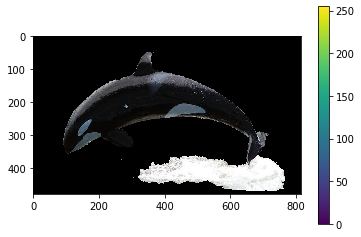

In [55]:
import cv2
img = cv2.imread('../images/whale.jpg')
mask = np.zeros(img.shape[:2],np.uint8)
bg_model = np.zeros((1,65),np.float64)
fg_model = np.zeros((1,65),np.float64)
rect = (80,50,720,420)
cv2.grabCut(img, mask, rect, bg_model, fg_model, 5, cv2.GC_INIT_WITH_RECT)
mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')
img = img*mask2[:,:,np.newaxis]
pylab.imshow(img)
pylab.colorbar()
pylab.show()

### Edges-based/region-based segmentation

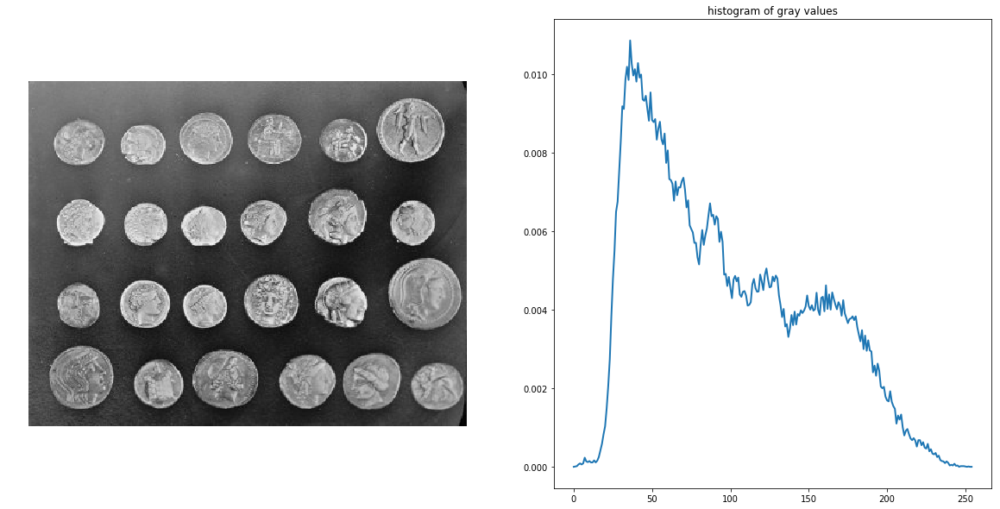

In [13]:
coins = data.coins()
#print(np.max(coins), np.min(coins), np.mean(coins))
hist = np.histogram(coins, bins=np.arange(0, 256), normed=True)
#print(hist)

fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(coins, cmap=plt.cm.gray, interpolation='nearest')
axes[0].axis('off')
axes[1].plot(hist[1][:-1], hist[0], lw=2)
axes[1].set_title('histogram of gray values')
plt.show()

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\scipy\ndimage\measurements.py:431: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  safe = ((np.issubdtype(dt, int) and dt.itemsize <= int_size) or


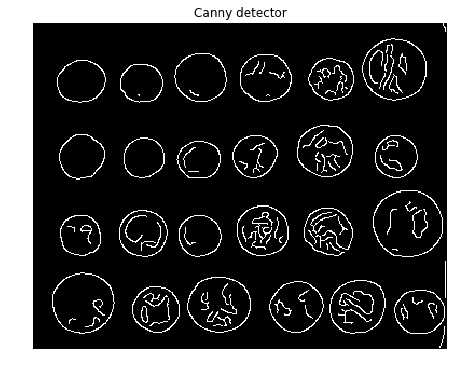

In [14]:
edges = canny(coins, sigma=2)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(edges, cmap=plt.cm.gray, interpolation='nearest')
ax.set_title('Canny detector')
ax.axis('off')
plt.show()

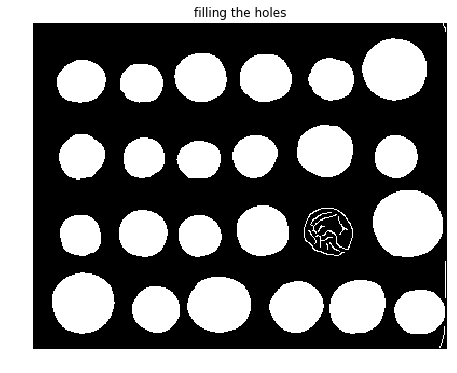

In [45]:
from scipy import ndimage as ndi

fill_coins = ndi.binary_fill_holes(edges)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(fill_coins, cmap=plt.cm.gray, interpolation='nearest')
ax.set_title('filling the holes')
ax.axis('off')
plt.show()

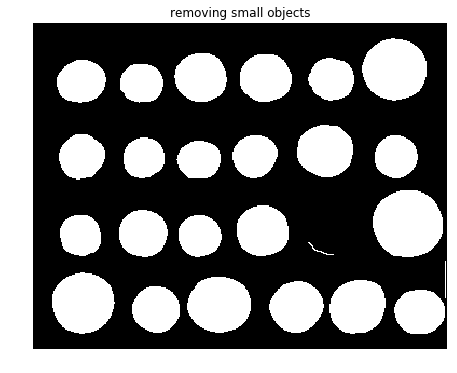

In [46]:
from skimage import morphology

coins_cleaned = morphology.remove_small_objects(fill_coins, 21)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(coins_cleaned, cmap=plt.cm.gray, interpolation='nearest')
ax.set_title('removing small objects')
ax.axis('off')
plt.show()

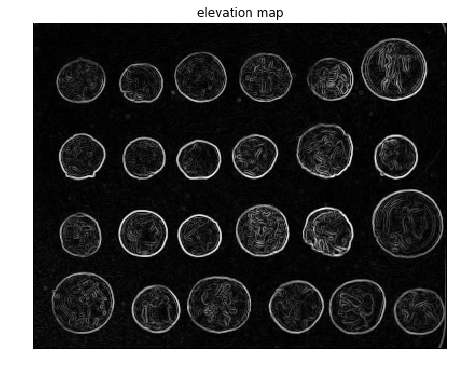

(303, 384)


In [47]:
from skimage.filters import sobel

elevation_map = sobel(coins)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(elevation_map, cmap=plt.cm.gray, interpolation='nearest')
ax.set_title('elevation map')
ax.axis('off')
plt.show()
print(elevation_map.shape)

2 0


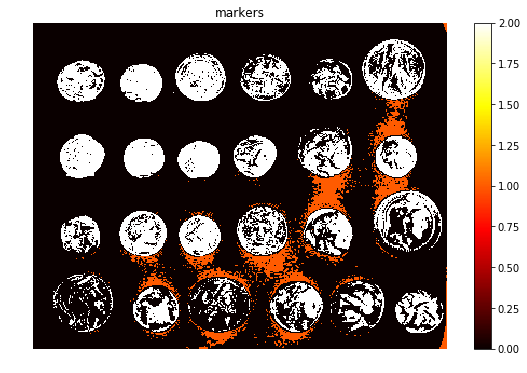

In [48]:
markers = np.zeros_like(coins)
markers[coins < 30] = 1
markers[coins > 150] = 2
print(np.max(markers), np.min(markers))

fig, ax = plt.subplots(figsize=(10, 6))
a = ax.imshow(markers, cmap=plt.cm.hot, interpolation='nearest')
plt.colorbar(a)
ax.set_title('markers')
ax.axis('off')
plt.show()

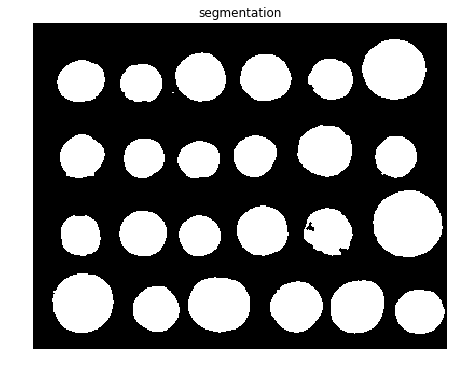

In [49]:
segmentation = morphology.watershed(elevation_map, markers)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(segmentation, cmap=plt.cm.gray, interpolation='nearest')
ax.set_title('segmentation')
ax.axis('off')
plt.show()

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25]


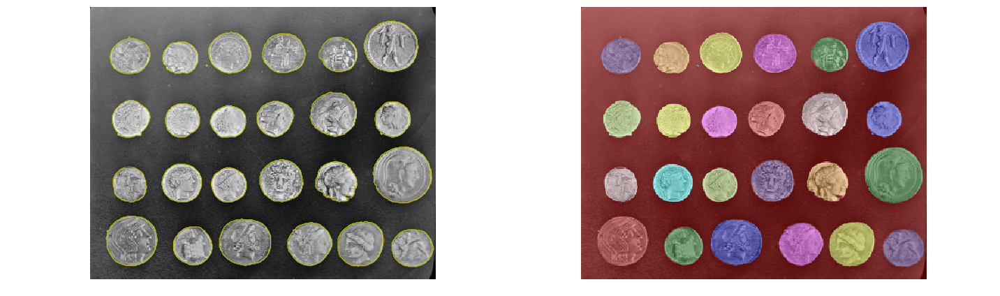

In [50]:
from skimage.color import label2rgb

segmentation = ndi.binary_fill_holes(segmentation - 1)
labeled_coins, _ = ndi.label(segmentation)
print(np.unique(labeled_coins))
image_label_overlay = label2rgb(labeled_coins, image=coins)

fig, axes = plt.subplots(1, 2, figsize=(20, 6), sharey=True)
axes[0].imshow(coins, cmap=plt.cm.gray, interpolation='nearest')
axes[0].contour(segmentation, [0.5], linewidths=1.2, colors='y')
axes[1].imshow(image_label_overlay, interpolation='nearest')

for a in axes:
    a.axis('off')

plt.tight_layout()

plt.show()

### Summary                                                        
In this chapter, we discussed image segmentation and demonstrated different algorithms with Python libraries such as scikit-image, opencv (cv2) and SimpleITK. We started with line and circle detection in an image with Hough transform and also showed an example of how it can be used for image segmentation. Next, we discussed Otsu's thresholding algorithm to find the optimal threshold for segmentation. Then edge-based and region-based segmentation algorithms were demonstrated along with the morphological watershed algorithm for image segmentation. In the next section, some more segmentation algorithms such as Felzenszwalb's graph-based algorithm, region growing, SLIC, and QuickShift were discussed, along with the implementations using scikit-image. Finally, we discussed some more sophisticated segmentation algorithms, such as GrabCut, active contours, and morphological snakes. 


In the next chapter, we shall discuss machine learning techniques in image processing, and we will discuss more on image segmentation with k-means clustering and mean-shift algorithms as unsupervised machine learning algorithms. We will also discuss semantic segmentation techniques later in the deep-learning chapters

### Further reading                                                        
- http://scikit-image.org/docs/dev/user_guide/tutorial_segmentation.html
- https://www.scipy-lectures.org/packages/scikit-image/index.html
- http://scikit-image.org/docs/dev/auto_examples/
- https://web.stanford.edu/class/ee368/Handouts/Lectures/2014_Spring/Combined_Slides/6-Image-Segmentation-Combined.pdf
- https://courses.csail.mit.edu/6.869/lectnotes/lect19/lect19-slides-6up.pdf
- http://cmm.ensmp.fr/~beucher/publi/WTS_residues.pdf
- http://cmm.ensmp.fr/~beucher/wtshed.html
- https://sandipanweb.wordpress.com/2018/02/25/graph-based-image-segmentation-in-python/
- https://sandipanweb.wordpress.com/2018/02/11/interactive-image-segmentation-with-graph-cut/
- http://people.cs.uchicago.edu/~pff/papers/seg-ijcv.pdf
- http://www.kev-smith.com/papers/SMITH_TPAMI12.pdf